# The Effect of the Initial Forward variance curve $\xi_0(u)$ on VIX Option Prices and VIX Smiles

## 1. Initial Forward Variance Curve $\xi_0(u)$

We consider five different shapes of the initial forward variance curve $\xi_0(u)$:

* Flat: A constant variance over time.
* Contango: A variance curve that increases over time.
* Backwardation: A variance curve that decreases over time.
* Hump: A variance curve that increases for a while and then decreases.
* U-shape: A variance curve that decreases for a while and then increases.

Moreover, we model the initial forward variance curve $\xi_0(u)$ in two different ways:

* Exponential mean reversion to a long-run variance level
\begin{align}
\xi_0(u) = \bar\xi + (\xi_0-\bar\xi) \mathrm{e}^{-\lambda u}.
\end{align}
The curve is contango if $\xi_0 < \bar\xi$, otherwise it is backwardation. In this model, the curve can not be hump or U-shape.

* Nelson–Siegel
\begin{align}
\xi_0(u) = \beta_0 + \beta_1 \mathrm{e}^{-\frac{u}{\tau_1}} + \beta_2 \frac{u}{\tau_2} \mathrm{e}^{-\frac{u}{\tau_2}}.
\end{align}
The curve is in contango for all maturities $u$ if $\beta_1 < 0$ and $\beta_2 = 0$, and it is in backwardation for all maturities $u$ if $\beta_1 > 0$ and $\beta_2 = 0$. However, even when $\beta_2 \neq 0$, the curve may exhibit contango or backwardation over a specified maturity interval, e.g. $u \in [0,1]$.

In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from standard_bergomi import StandardBergomi
from rough_bergomi import RoughBergomi
import utils

sns.set_theme("talk")
SEED = 777

In [3]:
vbar = 0.235**2
v0_flat = vbar
v0_contango = 0.035225
v0_backwardation = 0.075225

def xi0_exp_mean_reversion(t, shape="flat", lbd=7.0):
    if shape == "flat":
        return v0_flat + np.zeros_like(t)
    elif shape == "contango":
        return vbar + (v0_contango - vbar) * np.exp(-lbd * t)
    elif shape == "backwardation":
        return vbar + (v0_backwardation - vbar) * np.exp(-lbd * t)
    else:
        raise ValueError("Unknown shape")
    
beta0 = 0.235**2
beta1_contango = -0.02
beta2_contango = 0.01
tau1_contango = 0.5
tau2_contango = 2.0
beta1_backwardataion = 0.02
beta2_backwardataion = -0.01
tau1_backwardataion  = 0.5
tau2_backwardataion  = 2.0
beta1_hump = -0.02
beta2_hump =  0.06
tau1_hump  = 0.15
tau2_hump  = 0.35
beta1_ushape =  0.02
beta2_ushape = -0.06
tau1_ushape  = 0.15
tau2_ushape  = 0.35

def xi0_nelson_siegel(t, shape="flat"):
    if shape == "flat":
        return beta0 + np.zeros_like(t)
    elif shape == "contango":
        return beta0 + beta1_contango * np.exp(-t / tau1_contango) + beta2_contango * t / tau2_contango * np.exp(-t / tau2_contango)
    elif shape == "backwardation":
        return beta0 + beta1_backwardataion * np.exp(-t / tau1_backwardataion) + beta2_backwardataion * t / tau2_backwardataion * np.exp(-t / tau2_backwardataion)
    elif shape == "hump":
        return beta0 + beta1_hump * np.exp(-t / tau1_hump) + beta2_hump * t / tau2_hump * np.exp(-t / tau2_hump)
    elif shape == "ushape":
        return beta0 + beta1_ushape * np.exp(-t / tau1_ushape) + beta2_ushape * t / tau2_ushape * np.exp(-t / tau2_ushape)
    else:
        raise ValueError("Unknown shape")

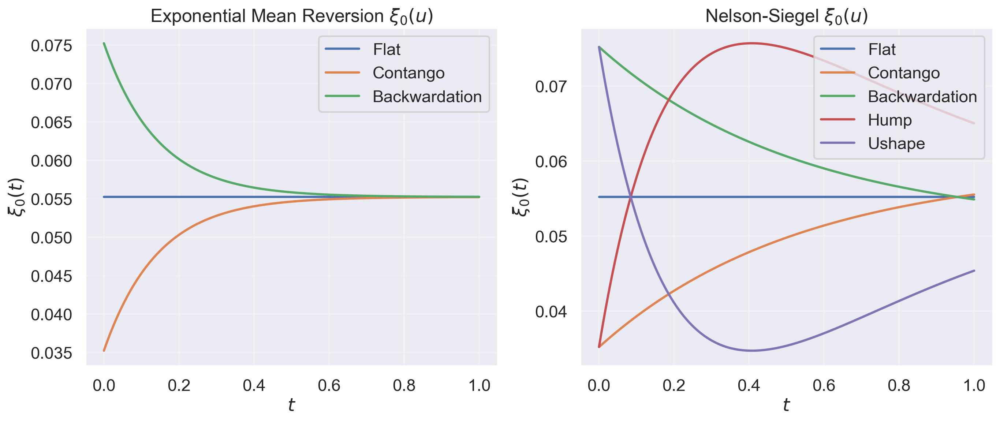

In [4]:
ts = np.linspace(1e-4, 1, 1000)

configs = {
    "exp": (xi0_exp_mean_reversion, ["flat", "contango", "backwardation"]),
    "ns": (xi0_nelson_siegel, ["flat", "contango", "backwardation", "hump", "ushape"])
}

plot_configs = [
    ("Exponential Mean Reversion", xi0_exp_mean_reversion, configs["exp"][1]),
    ("Nelson-Siegel", xi0_nelson_siegel, configs["ns"][1])
]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, func, shapes) in enumerate(plot_configs):
    for s in shapes:
        ax[i].plot(ts, func(ts, shape=s), label=s.capitalize())
    
    ax[i].set_xlabel("$t$")
    ax[i].set_ylabel(r"$\xi_0(t)$")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()
    ax[i].grid(True, alpha=0.3)

plt.show()

In [5]:
maturities = {
    "1M": 1.0 / 12.0,
    "3M": 3.0 / 12.0,
    "6M": 6.0 / 12.0
}

mat_values = list(maturities.values())

In [6]:
base_params_b = {"omega": 2, "k": 1}

models_b = {}
for name, (func, shapes) in configs.items():
    models_b[name] = {}
    
    for s in shapes:
        model = StandardBergomi(**base_params_b, xi0=lambda u, s=s, f=func: f(u, shape=s))
        models_b[name][s] = model

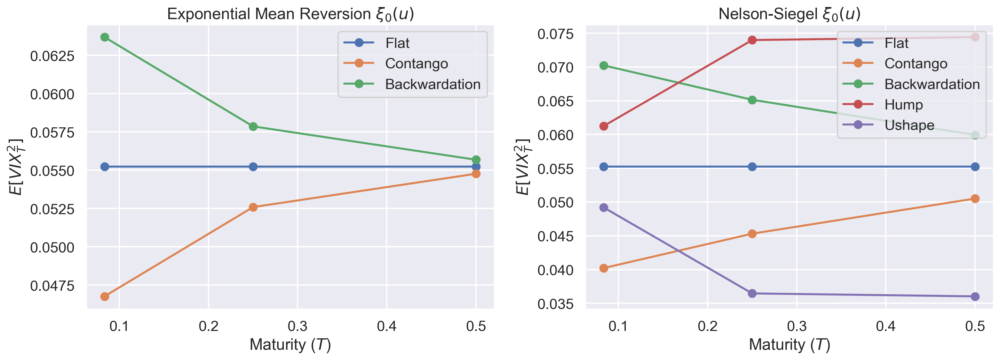

In [7]:
fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"

    for s in shapes:
        data = np.array([models_b[m_key][s].fut_vix2(T) for T in mat_values])
        ax[i].plot(mat_values, data, label=s.capitalize(), marker='o')
    
    ax[i].set_xlabel("Maturity ($T$)")
    ax[i].set_ylabel(r"$E[VIX_T^2]$")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

## 2. Standard Bergomi Model

### 2.1 The effect on the VIX futures prices

In [8]:
n_time = 80
n_space = 80

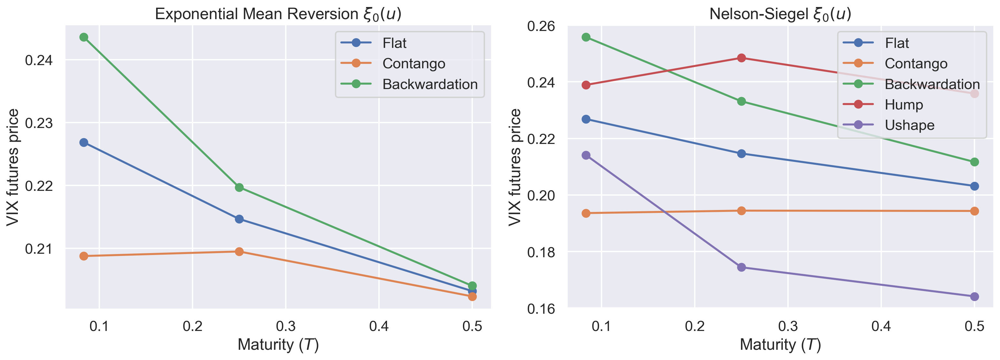

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"

    for s in shapes:
        data = np.array([models_b[m_key][s].vix_opt_price(0, T, 0, n_time, n_space) for T in mat_values])
        ax[i].plot(mat_values, data, label=s.capitalize(), marker='o')
    
    ax[i].set_xlabel("Maturity ($T$)")
    ax[i].set_ylabel("VIX futures price")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 2.2 The effect on VIX smiles

In [10]:
m = np.linspace(-0.1, 0.4, 10)
T = 3.0 / 12.0

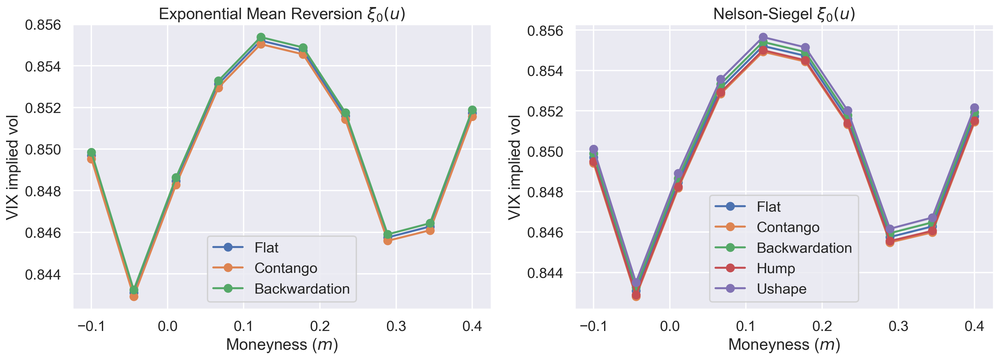

In [11]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_b[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.vix_implied_vol(0, T, n_time, n_space)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.vix_implied_vol(k_vals, T, n_time, n_space)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

## 3. Rough Bergomi Model

In [12]:
base_params_rb = {"eta": 1, "H": 0.1}

models_rb = {}
for name, (func, shapes) in configs.items():
    models_rb[name] = {}
    
    for s in shapes:
        model = RoughBergomi(**base_params_rb, xi0=lambda u, s=s, f=func: f(u, shape=s))
        models_rb[name][s] = model

### 3.1 The effect on VIX futures prices

In [13]:
n_disc = 300
n_mc = 10**6

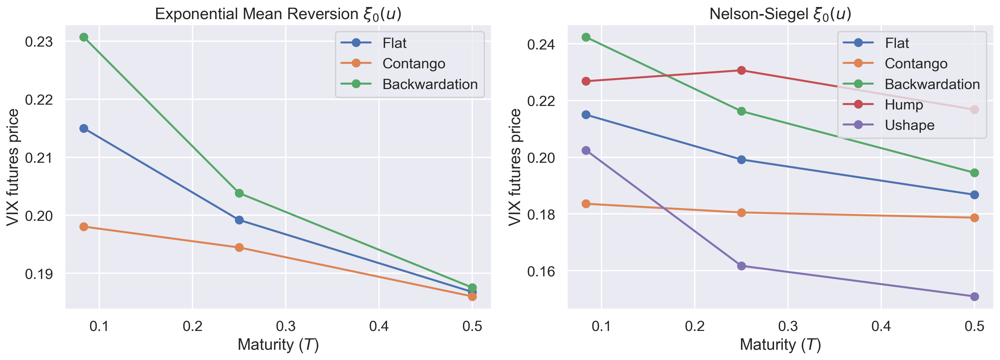

In [14]:
fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(16, 6))

for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"

    for s in shapes:
        data = np.array([models_rb[m_key][s].vix_opt_price(0, T, 0, n_disc, n_mc, SEED) for T in mat_values])
        ax[i].plot(mat_values, data, label=s.capitalize(), marker='o')
    
    ax[i].set_xlabel("Maturity ($T$)")
    ax[i].set_ylabel("VIX futures price")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 3.2 The effect on VIX smiles

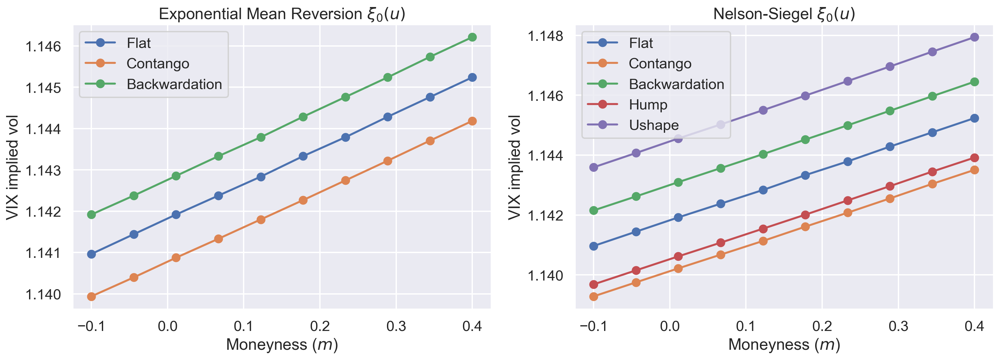

In [15]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_rb[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.vix_implied_vol(0, T, n_disc, n_mc, SEED)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.vix_implied_vol(k_vals, T, n_disc, n_mc, SEED)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

## 4. Mixed Standard Bergomi model

### 4.1 The effect on VIX futures prices

In [16]:
base_params_mb = {"omega": 10, "k": 1}
omega2 = 2
lbd_b = 0.2

models_mb = {}
for name, (func, shapes) in configs.items():
    models_mb[name] = {}
    
    for s in shapes:
        model = StandardBergomi(**base_params_mb, xi0=lambda u, s=s, f=func: f(u, shape=s))
        models_mb[name][s] = model

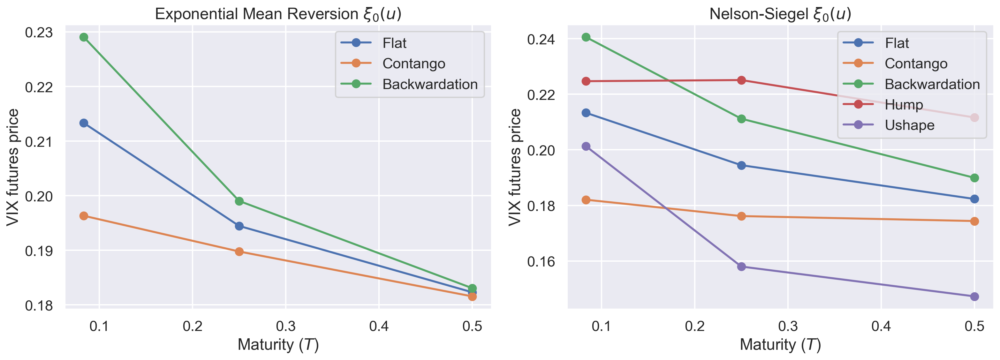

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"

    for s in shapes:
        data = np.array([models_mb[m_key][s].vix_opt_price_mixed(0, T, omega2, lbd_b, 0, n_time, n_space) for T in mat_values])
        ax[i].plot(mat_values, data, label=s.capitalize(), marker='o')
    
    ax[i].set_xlabel("Maturity ($T$)")
    ax[i].set_ylabel("VIX futures price")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 4.2 The effect on VIX smiles

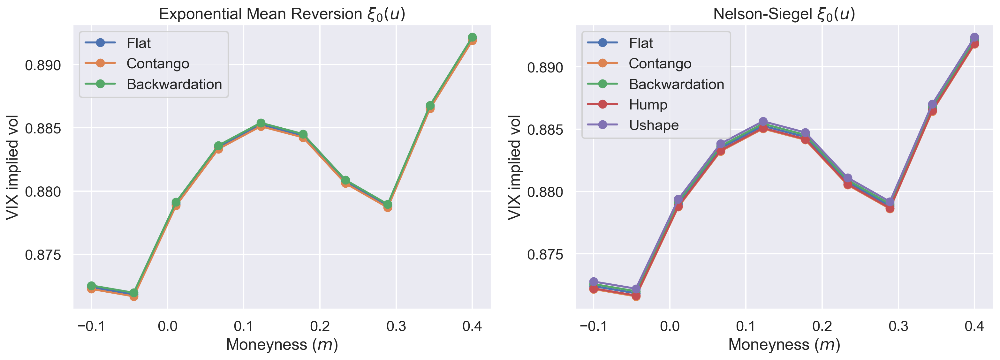

In [18]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_mb[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.vix_implied_vol_mixed(0, T, omega2, lbd_b, n_time, n_space)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.vix_implied_vol_mixed(k_vals, T, omega2, lbd_b, n_time, n_space)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

## 5. Mixed Rough Bergomi Model

In [19]:
base_params_mrb = {"eta": 1.4, "H": 0.1}
eta2 = 0.7
lbd_rb = 0.3

models_mrb = {}
for name, (func, shapes) in configs.items():
    models_mrb[name] = {}
    
    for s in shapes:

        model = RoughBergomi(**base_params_mrb, xi0=lambda u, s=s, f=func: f(u, shape=s))
        models_mrb[name][s] = model

### 5.1 The effect on VIX futures prices

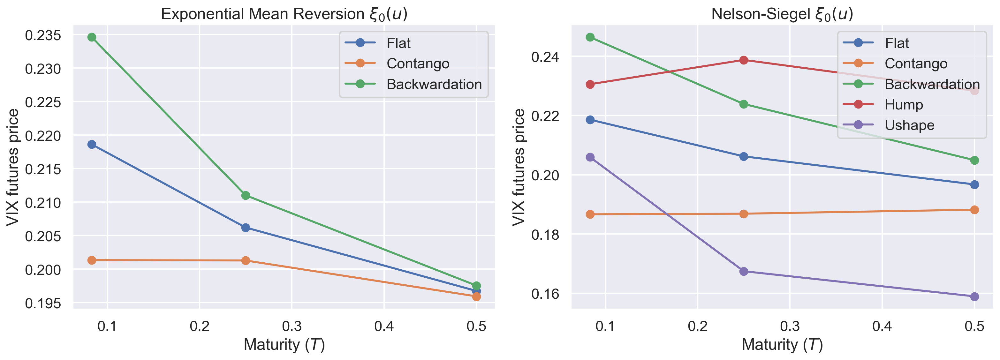

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=2,  figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"

    for s in shapes:
        data = np.array([models_mrb[m_key][s].vix_opt_price_mixed(0, T, eta2, lbd_rb, 0, n_disc, n_mc, SEED) for T in mat_values])
        ax[i].plot(mat_values, data, label=s.capitalize(), marker='o')
    
    ax[i].set_xlabel("Maturity ($T$)")
    ax[i].set_ylabel("VIX futures price")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 5.2 The effect on VIX smiles

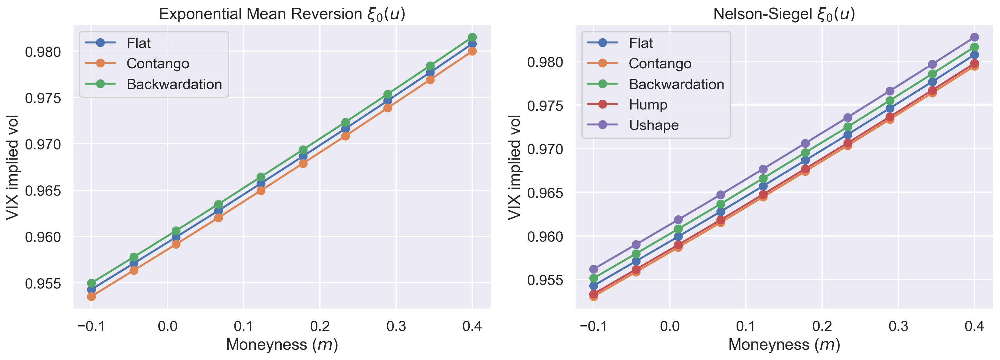

In [21]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_mrb[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.vix_implied_vol_mixed(0, T, eta2, lbd_rb, n_disc, n_mc, SEED)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.vix_implied_vol_mixed(k_vals, T, eta2, lbd_rb, n_disc, n_mc, SEED)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

## 6. The Effect on the VIX Implied Volatility Expansion

### 6.1 Standard Bergomi model

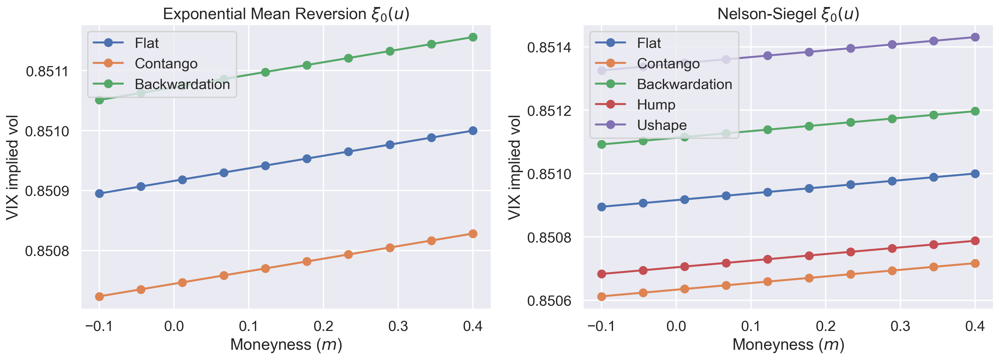

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_b[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.implied_vol_expan(0, T)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.implied_vol_expan(k_vals, T)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 6.2 Rough Bergomi Model

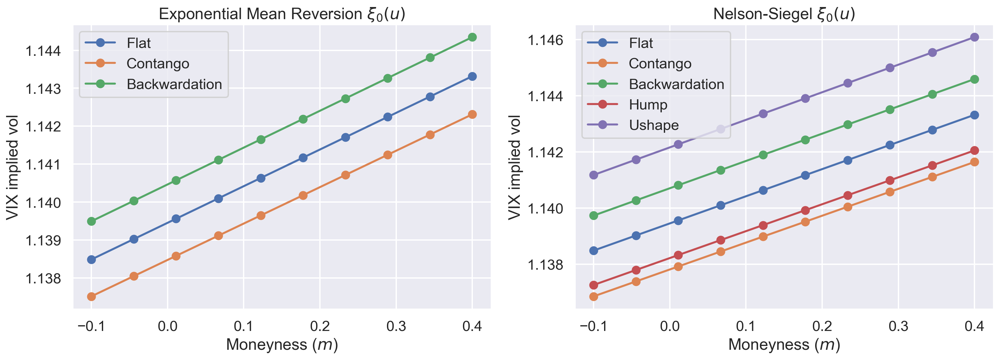

In [23]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_rb[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.implied_vol_expan(0, T)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.implied_vol_expan(k_vals, T)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 6.3 Mixed standard Bergomi model

In [24]:
rule = -1
formula = 1
n_max = 20

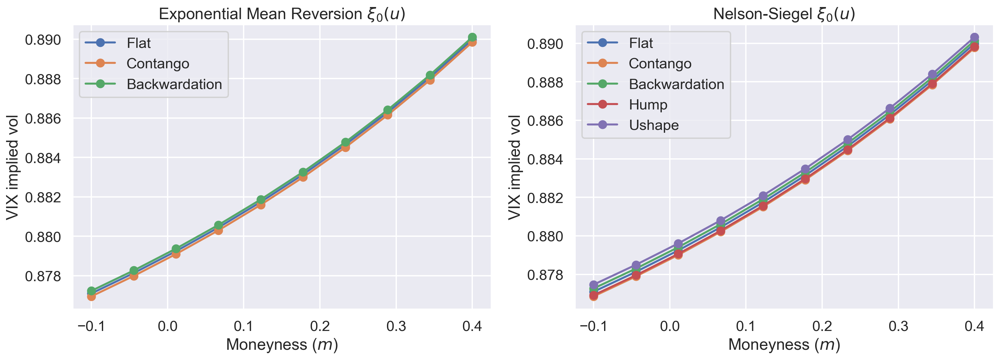

In [25]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_mb[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.implied_vol_expan_mixed(0, T, rule, omega2, lbd_b, n_max, n_mc, formula)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.implied_vol_expan_mixed(k_vals, T, rule, omega2, lbd_b, n_max, n_mc, formula)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

### 6.4 Mixed rough Bergomi Model

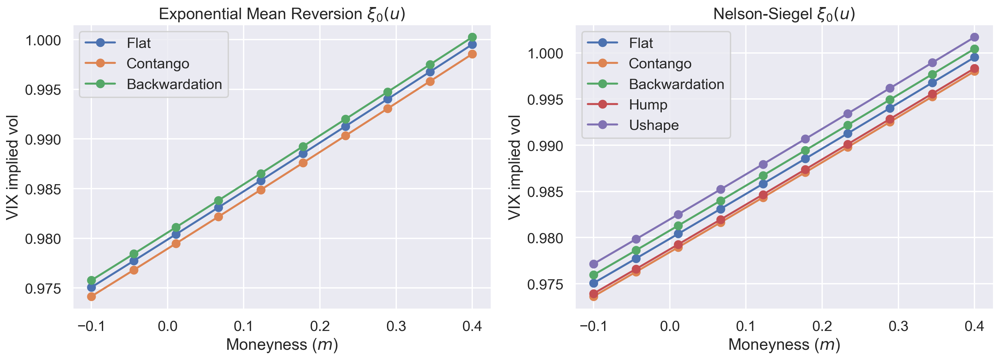

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
for i, (title_name, _, shapes) in enumerate(plot_configs):
    m_key = "exp" if i == 0 else "ns"
    group = models_mrb[m_key]
    
    for s in shapes:
        model = group[s]
        atm = model.implied_vol_expan_mixed(0, T, rule, eta2, lbd_rb, n_max, n_mc, formula)
        k_vals = m * atm * np.sqrt(T)
        iv_data = model.implied_vol_expan_mixed(k_vals, T, rule, eta2, lbd_rb, n_max, n_mc, formula)
        ax[i].plot(m, iv_data, label=s.capitalize(), marker='o')

    ax[i].set_xlabel("Moneyness ($m$)")
    ax[i].set_ylabel("VIX implied vol")
    ax[i].set_title(fr"{title_name} $\xi_0(u)$")
    ax[i].legend()

plt.tight_layout()
plt.show()

## 7. The effect on the accuracy of the VIX implied volatility expansion

### 7.1 Standard Bergomi model

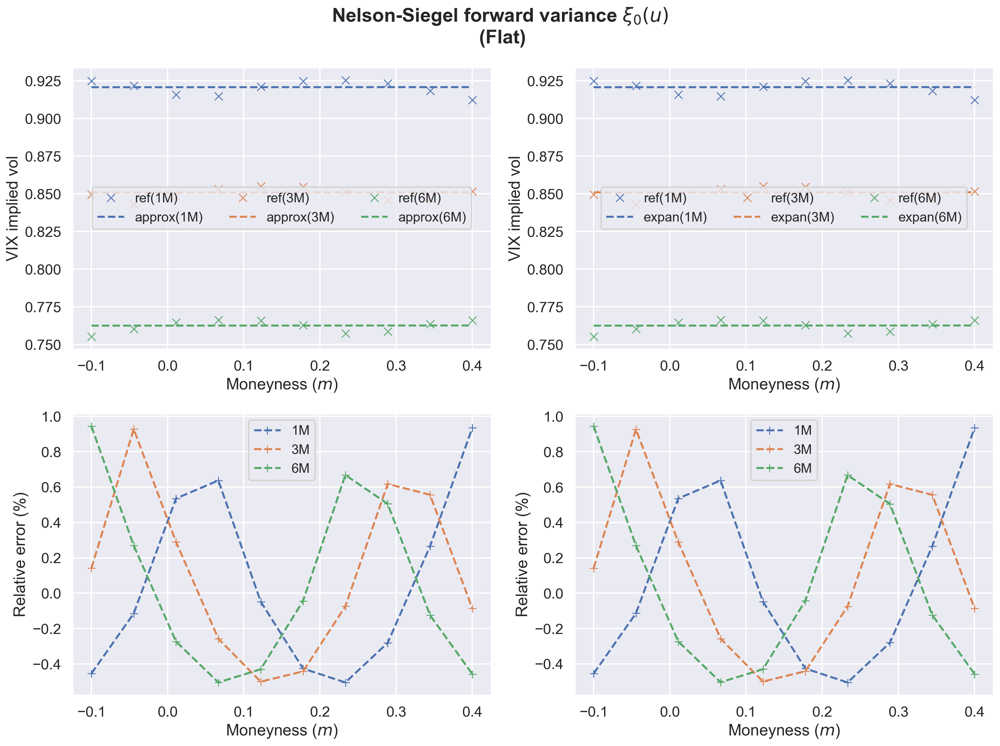

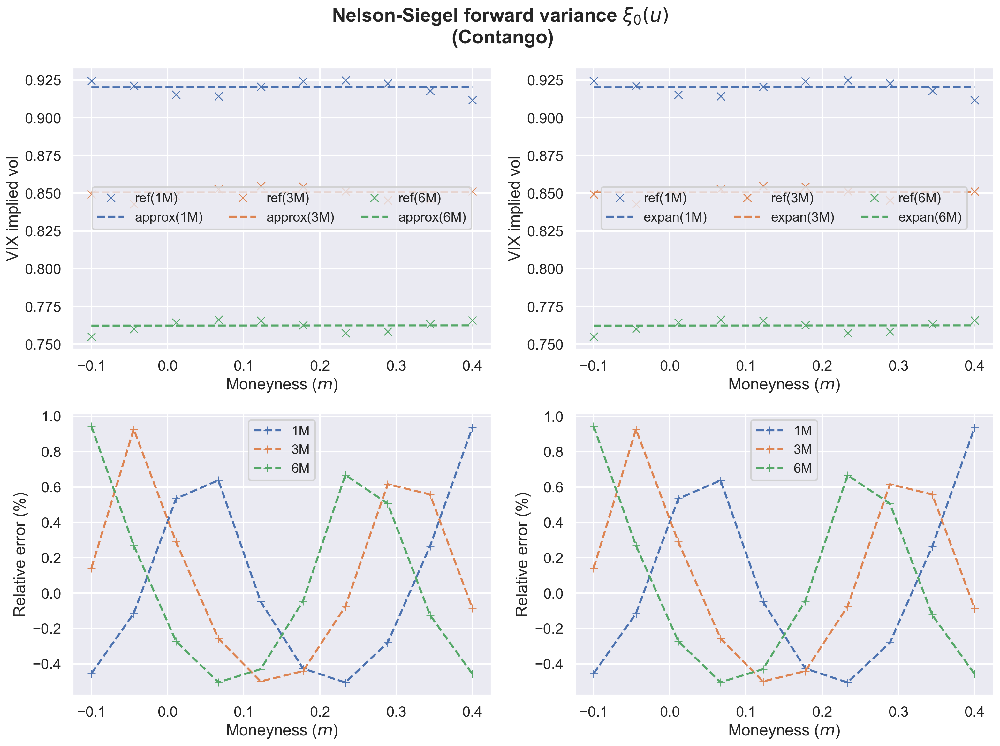

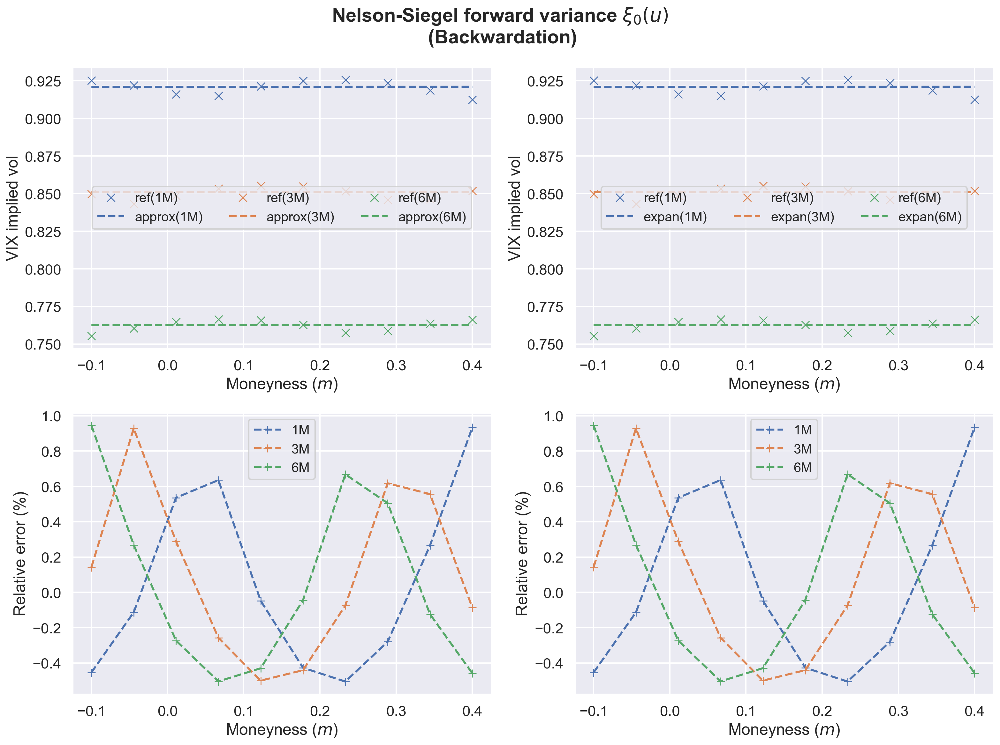

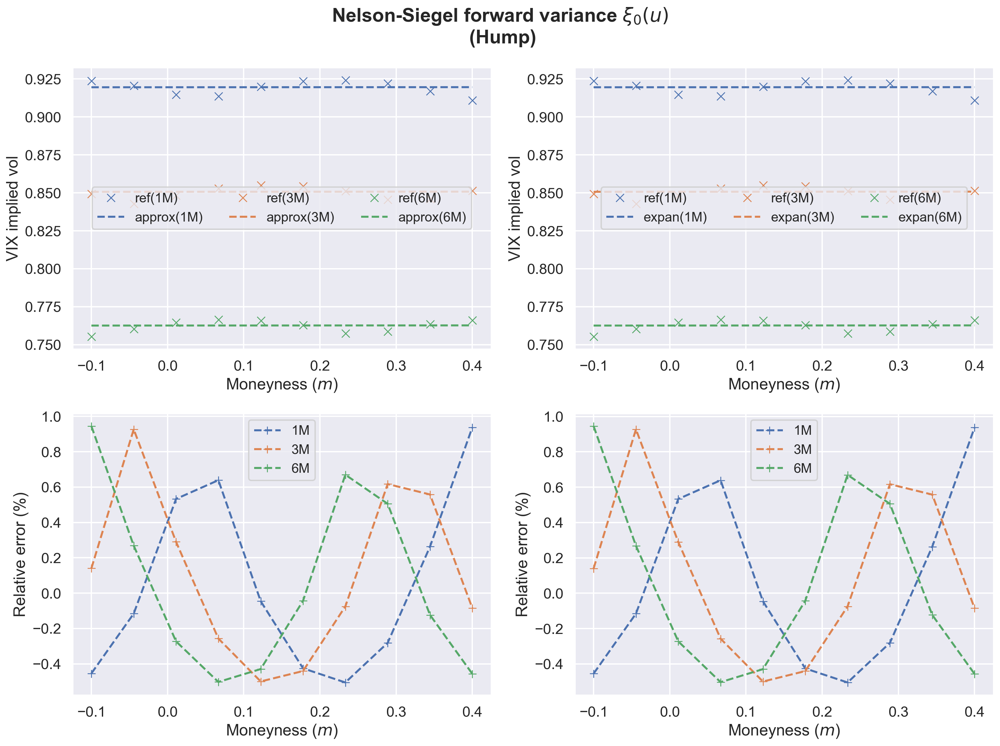

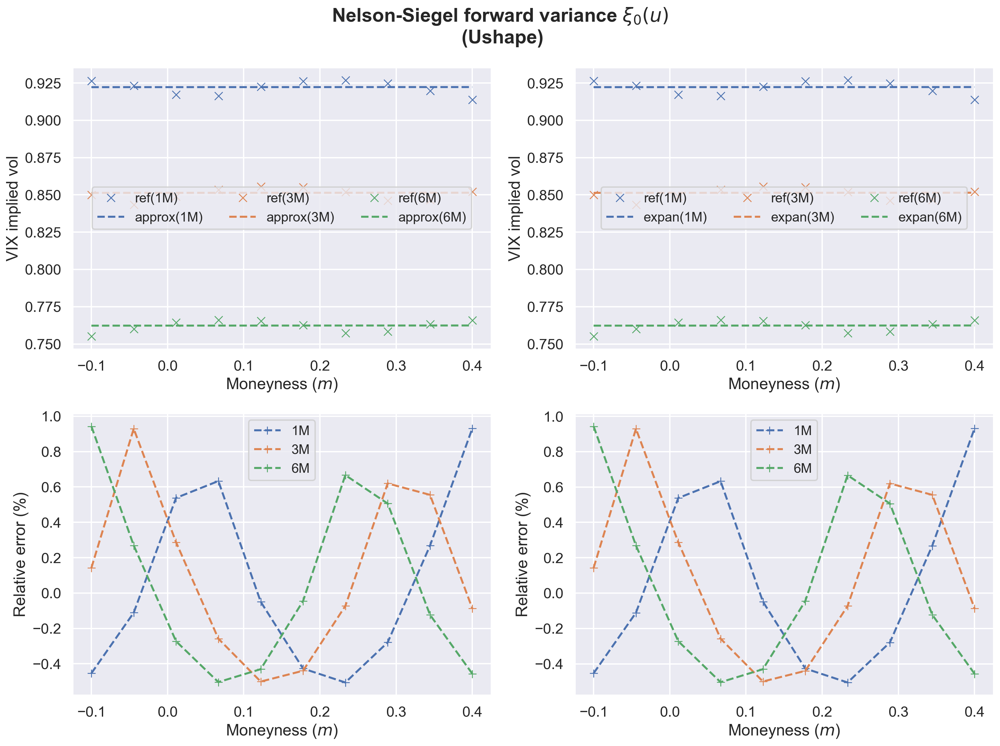

In [27]:
calc_methods = {
    "Ref":   ("vix_implied_vol", True),
    "Proxy": ("implied_vol_proxy", False),
    "Expan": ("implied_vol_expan", False)
}

shapes = ["flat", "contango", "backwardation", "hump", "ushape"]

for s in shapes:
    
    b = models_b["ns"][s] 
    
    results = {}
    for label, (method_name, is_quadrature) in calc_methods.items():

        method = getattr(b, method_name)
        if is_quadrature:
            atm_iv = {mat: method(0, T, n_space, n_time) for mat, T in maturities.items()}
        else:
            atm_iv = {mat: method(0, T) for mat, T in maturities.items()}
            
        k_val = {mat: m * atm_iv[mat] * np.sqrt(T) for mat, T in maturities.items()}
        
        if is_quadrature:
            results[label] = {mat: method(k_val[mat], T, n_space, n_time) for mat, T in maturities.items()}
        else:
            results[label] = {mat: method(k_val[mat], T) for mat, T in maturities.items()}

    plot_title = (
        r"Nelson-Siegel forward variance $\xi_0(u)$" + "\n" +
        f" ({s.capitalize()})"
    )

    utils.plot_style_4(
        m, maturities, 
        results["Ref"], results["Proxy"], results["Expan"], 
        "Moneyness ($m$)", "VIX implied vol",
        plot_title
    )

### 7.2 Rough Bergomi Model

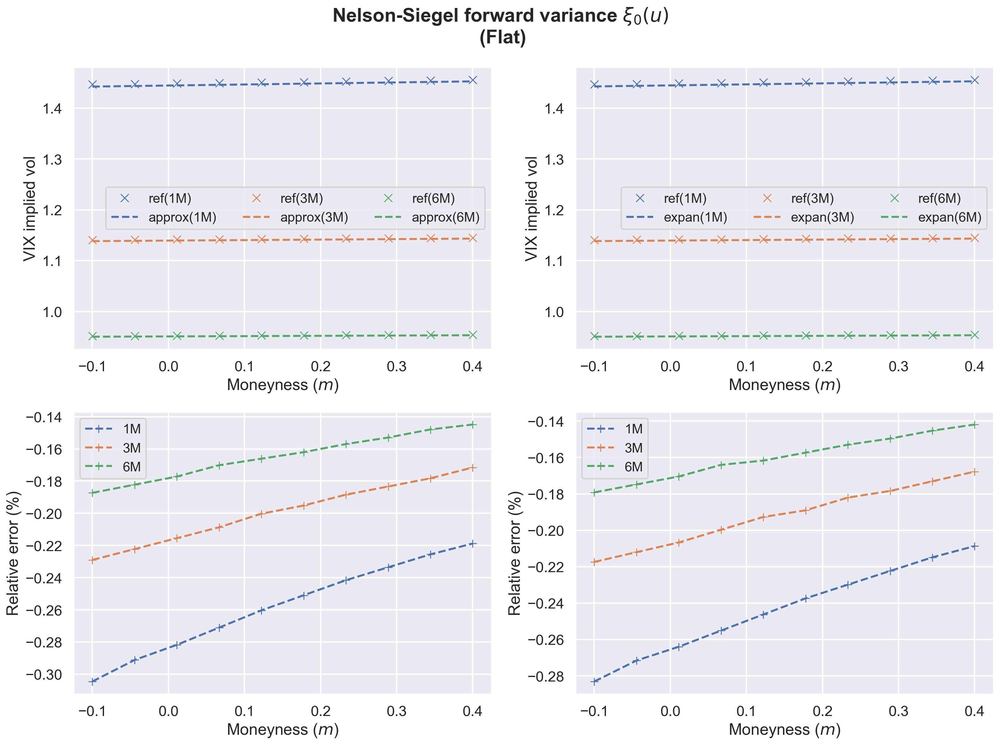

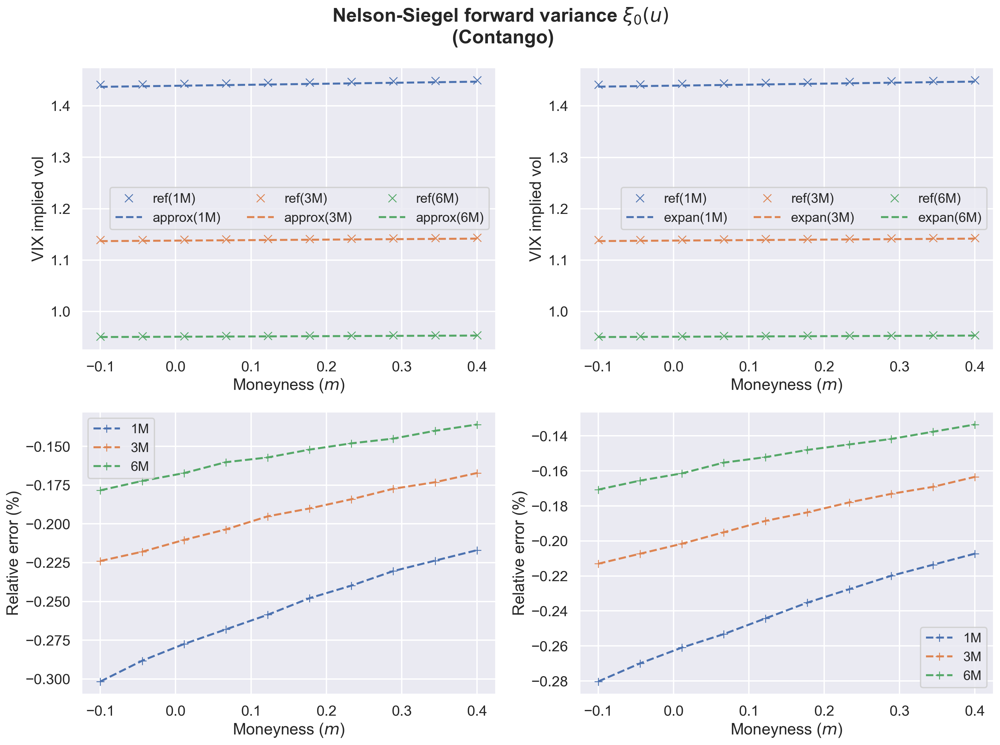

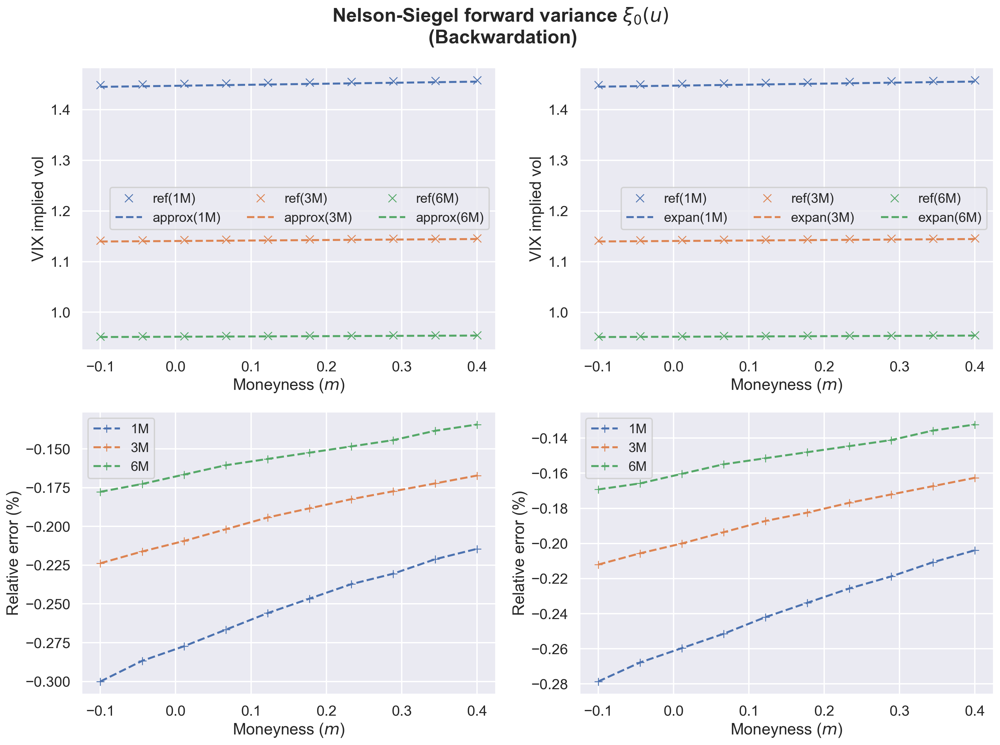

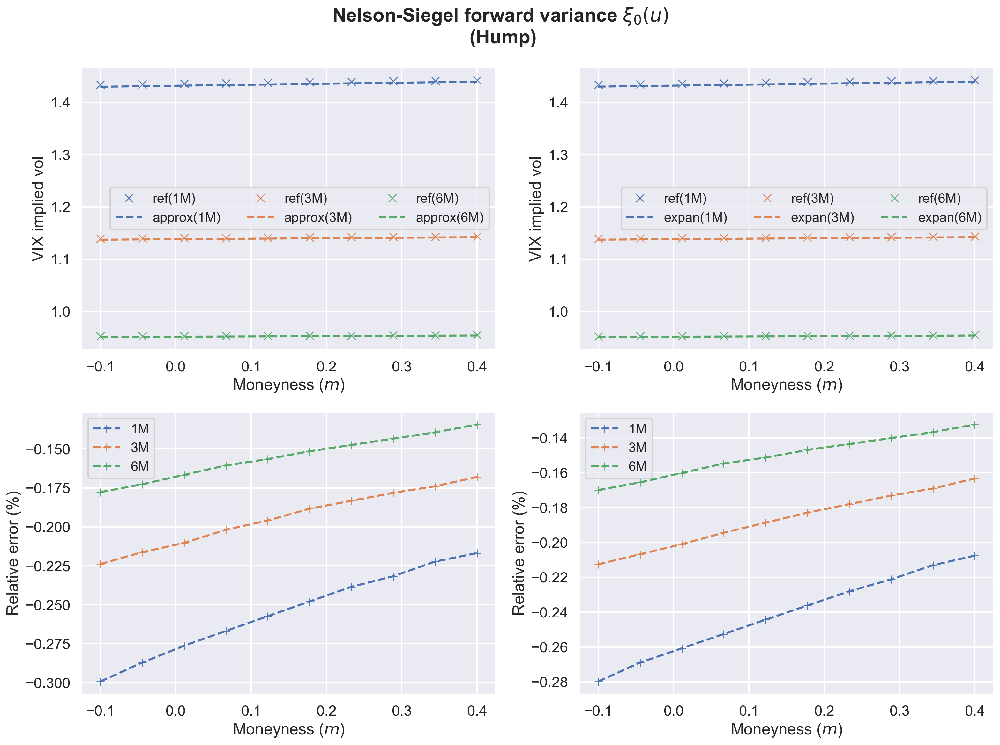

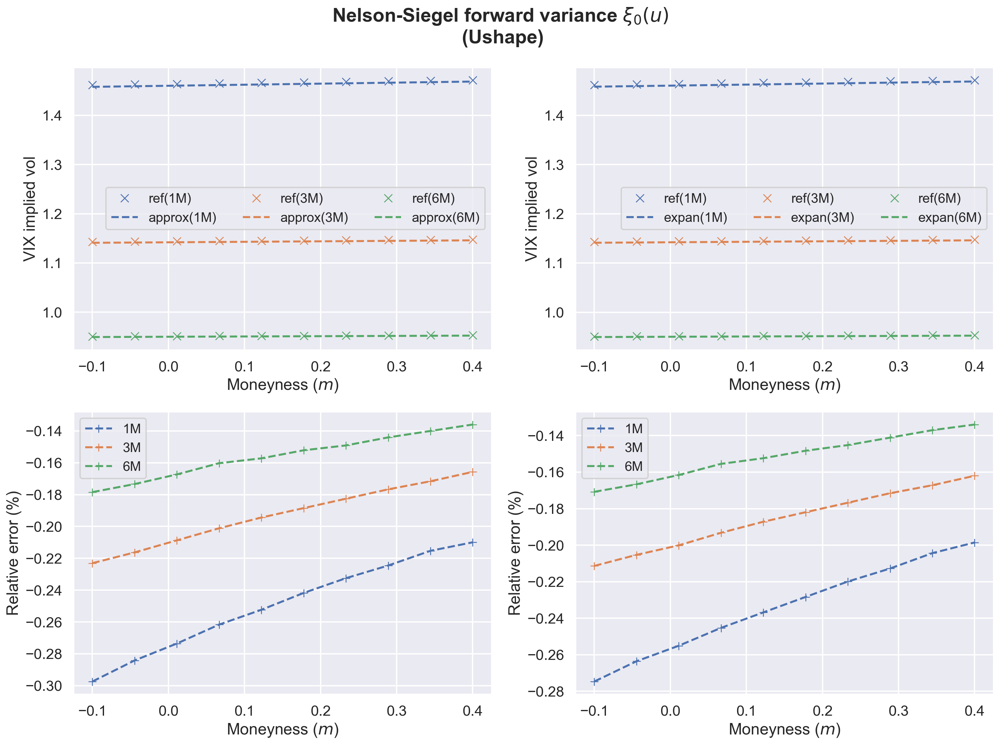

In [28]:
for s in shapes:
    
    rb = models_rb["ns"][s] 
    
    results = {}
    for label, (method_name, is_mc) in calc_methods.items():

        method = getattr(rb, method_name)
        if is_mc:
            atm_iv = {mat: method(0, T, n_disc, n_mc, SEED) for mat, T in maturities.items()}
        else:
            atm_iv = {mat: method(0, T) for mat, T in maturities.items()}
            
        k_val = {mat: m * atm_iv[mat] * np.sqrt(T) for mat, T in maturities.items()}
        
        if is_mc:
            results[label] = {mat: method(k_val[mat], T, n_disc, n_mc, SEED) for mat, T in maturities.items()}
        else:
            results[label] = {mat: method(k_val[mat], T) for mat, T in maturities.items()}

    plot_title = (
        r"Nelson-Siegel forward variance $\xi_0(u)$" + "\n" +
        f" ({s.capitalize()})"
    )

    utils.plot_style_4(
        m, maturities, 
        results["Ref"], results["Proxy"], results["Expan"], 
        "Moneyness ($m$)", "VIX implied vol",
        plot_title
    )

### 7.3 Mixed standard Bergomi model

In [29]:
n_gauss = 80

calc_methods = {
    "Ref": {
        "method": "vix_implied_vol_mixed",
        "kwargs": {"omega2": omega2, "lbd": lbd_b, "n_time": n_time, "n_space": n_space}
    },
    "Proxy": {
        "method": "implied_vol_proxy_mixed",
        "kwargs": {"omega2": omega2, "lbd": lbd_b, "n_gauss": n_gauss}
    },
    "Expan": {
        "method": "implied_vol_expan_mixed",
        "kwargs": {"rule": rule, "omega2": omega2, "lbd": lbd_b, "n_max": n_max, "n_mc": n_mc, "formula": formula}
    }
}

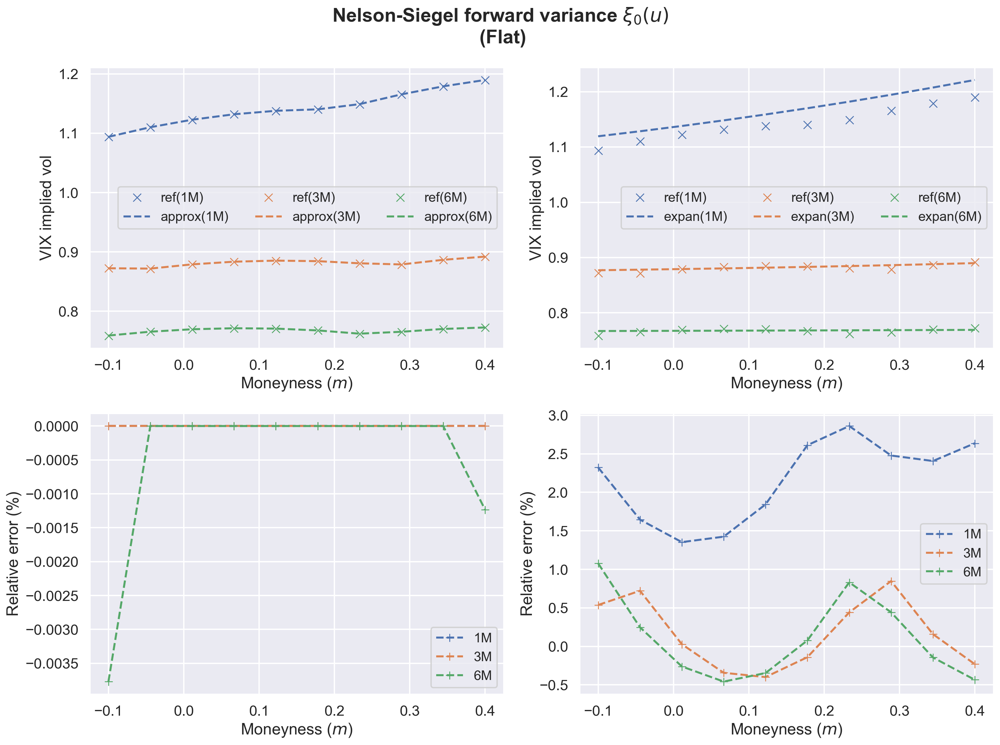

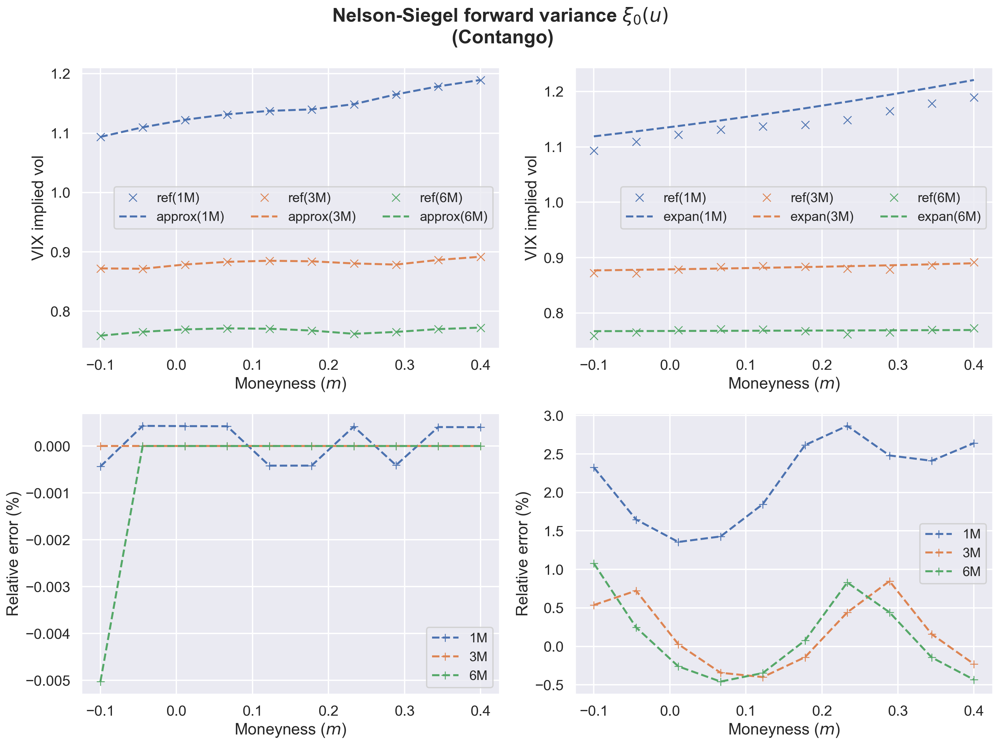

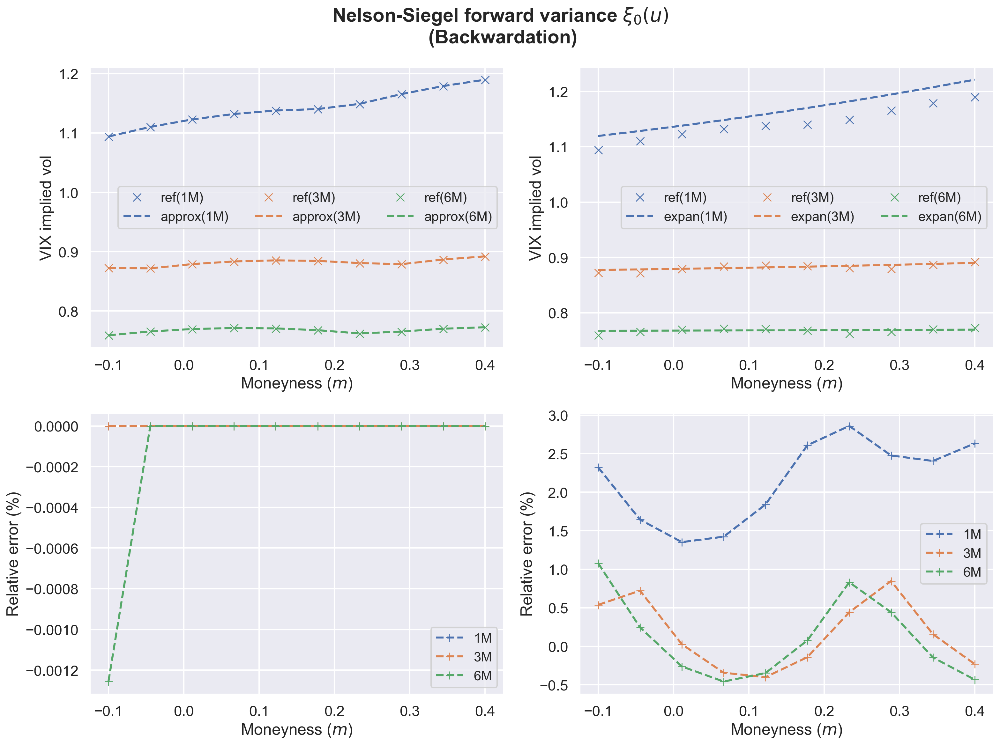

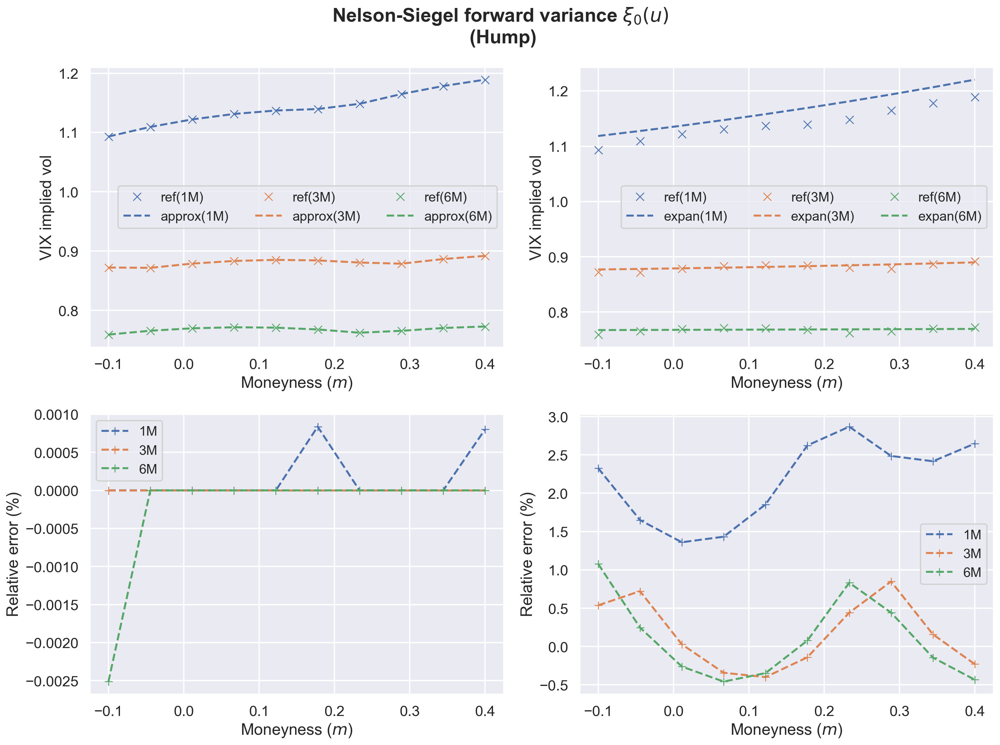

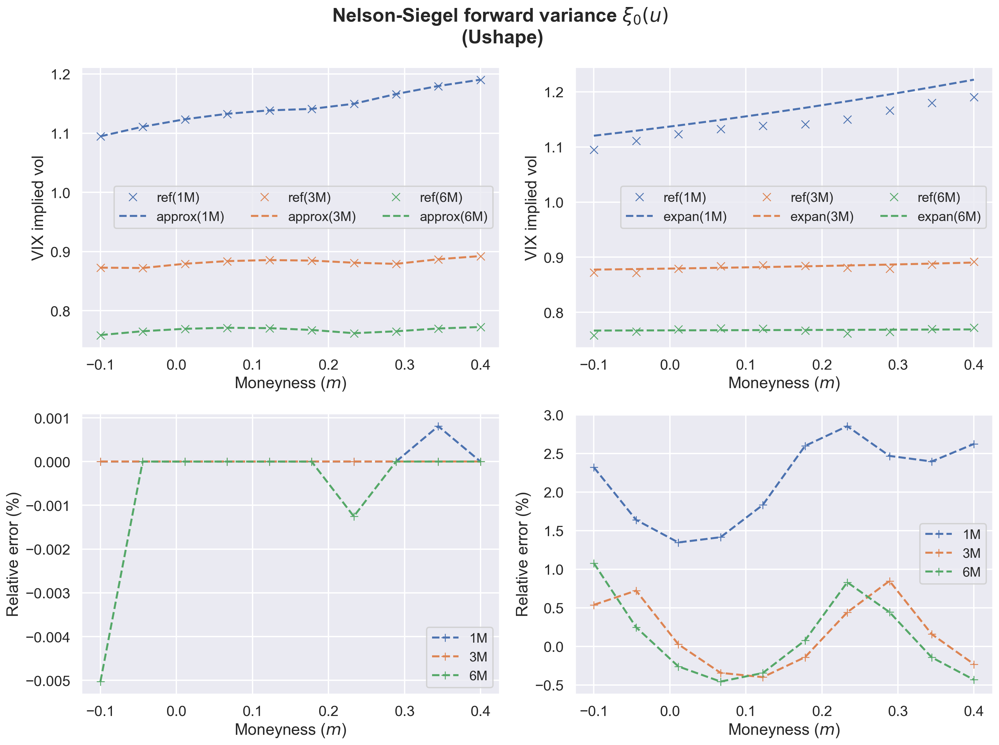

In [30]:
for s in shapes:
    
    b = models_mb["ns"][s]
    
    results = {}
    for label, config in calc_methods.items():
        func_name = config["method"]
        kwargs = config["kwargs"]
        method = getattr(b, func_name)

        def run_model(k_input, T_input):
            return method(k_input, T_input, **kwargs)

        atm_iv = {mat: run_model(0, T) for mat, T in maturities.items()}
        k_val = {mat: m * atm_iv[mat] * np.sqrt(T) for mat, T in maturities.items()}
        results[label] = {mat: run_model(k_val[mat], T) for mat, T in maturities.items()}

    plot_title = (
        r"Nelson-Siegel forward variance $\xi_0(u)$" + "\n" +
        f" ({s.capitalize()})"
    )

    utils.plot_style_4(
        m, maturities, 
        results["Ref"], results["Proxy"], results["Expan"], 
        "Moneyness ($m$)", "VIX implied vol",
        plot_title
    )

### 7.4 Mixed Rough Bergomi Model

In [31]:
calc_methods = {
    "Ref": {
        "method": "vix_implied_vol_mixed",
        "kwargs": {"eta2": eta2, "lbd": lbd_rb, "n_disc": n_disc, "n_mc": n_mc, "seed": SEED},
    },
    "Proxy": {
        "method": "implied_vol_proxy_mixed",
        "kwargs": {"eta2": eta2, "lbd": lbd_rb, "n_gauss": n_gauss},
    },
    "Expan": {
        "method": "implied_vol_expan_mixed",
        "kwargs": {"rule": rule, "eta2": eta2, "lbd": lbd_rb, "n_max": n_max, "n_mc": n_mc, "formula": formula},
    }
}

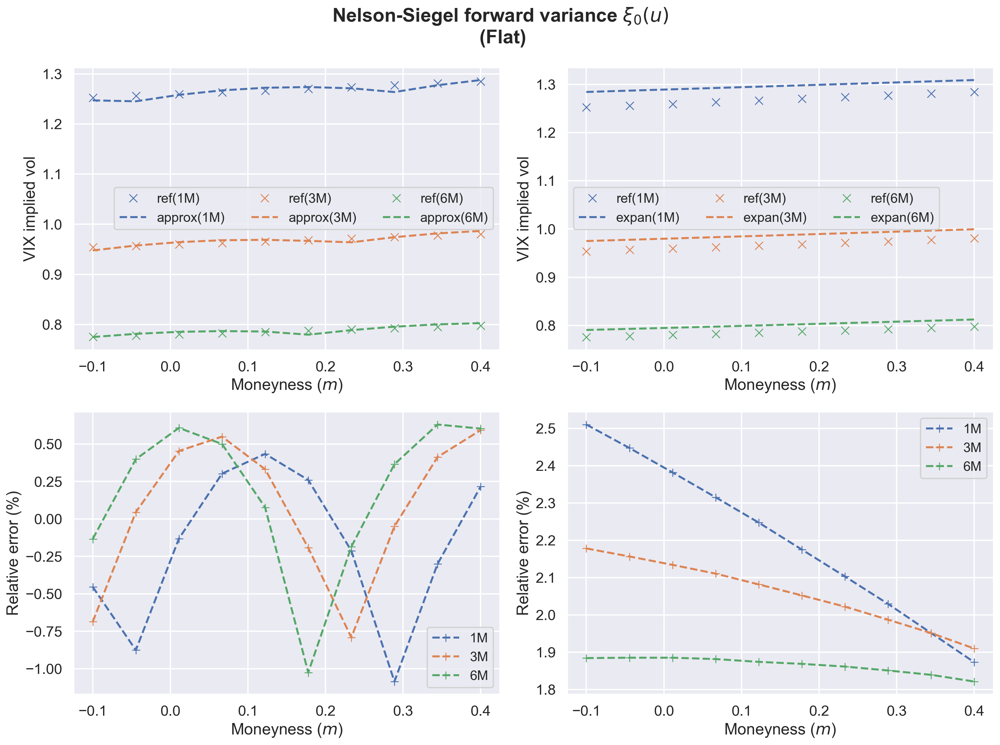

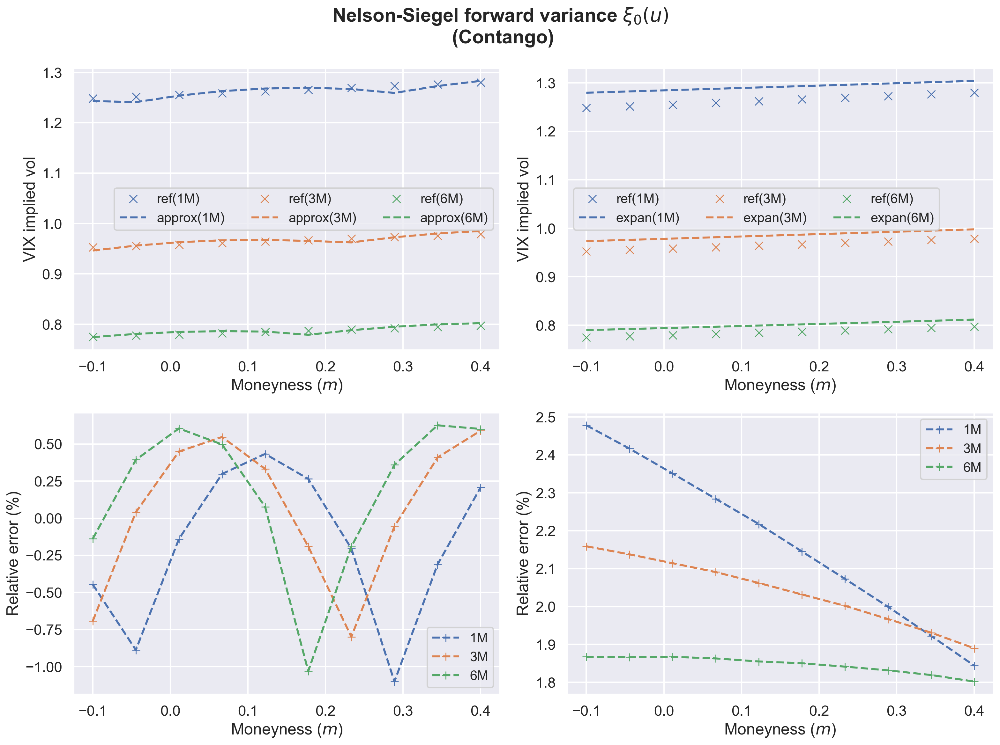

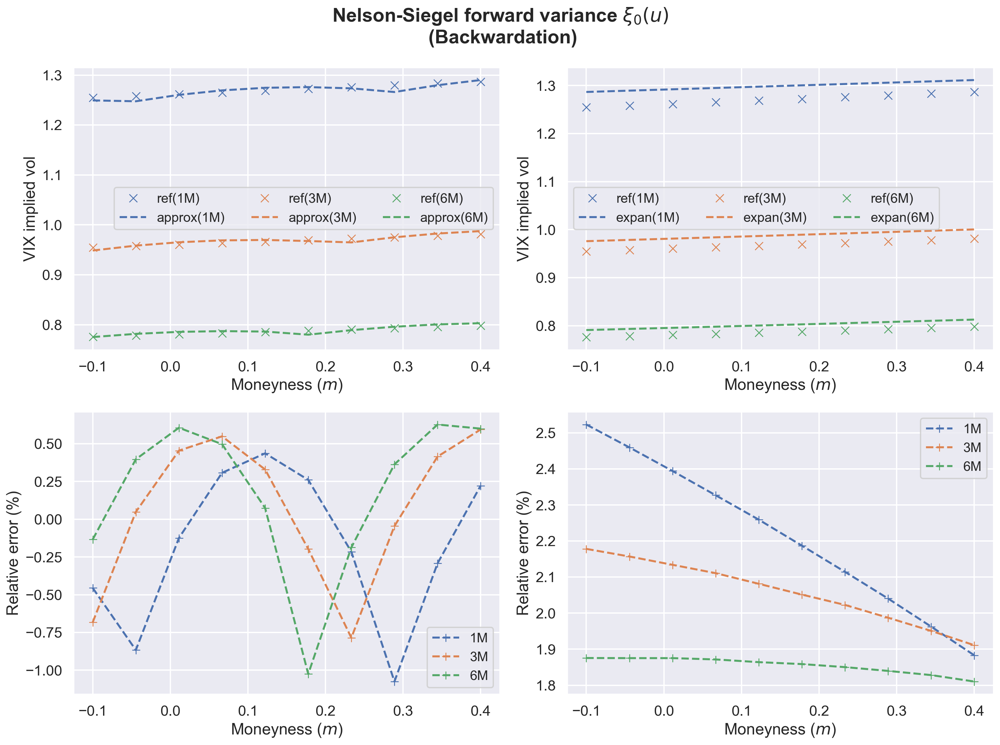

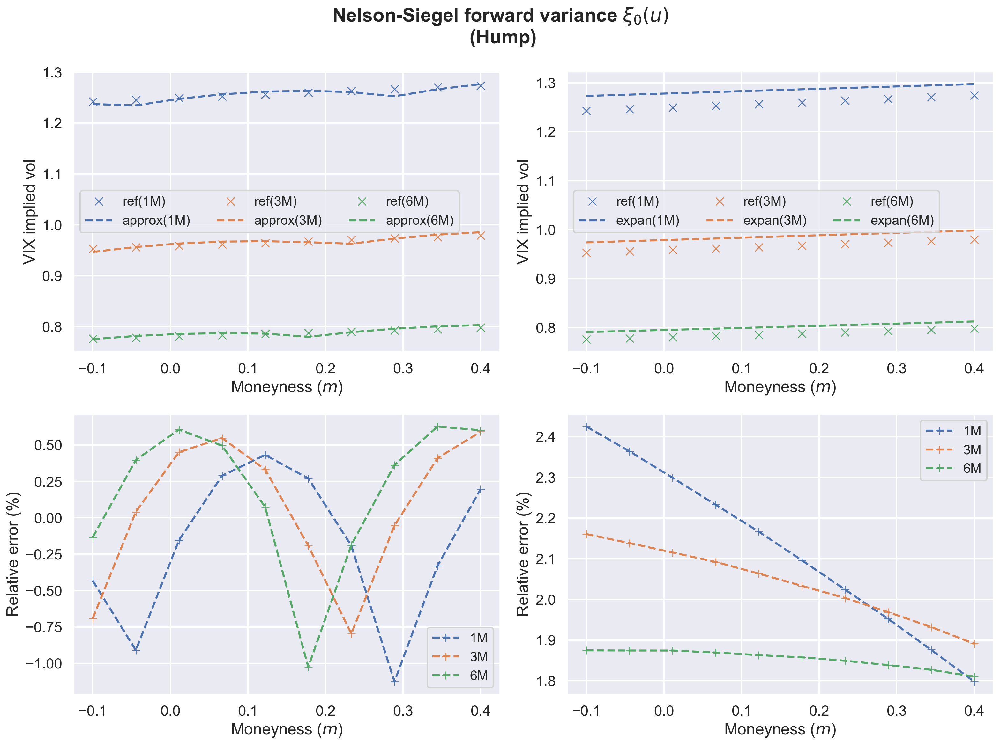

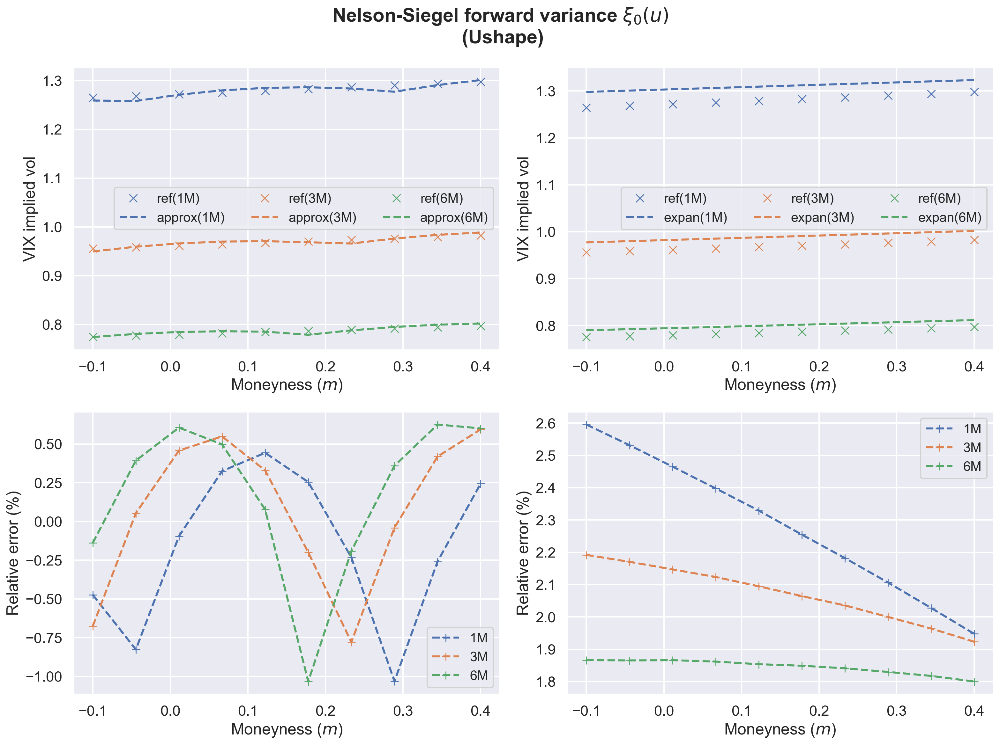

In [33]:
for s in shapes:
    
    rb = models_mrb["ns"][s]
    
    results = {}
    for label, config in calc_methods.items():
        func_name = config["method"]
        kwargs = config["kwargs"]
        method = getattr(rb, func_name)

        def run_model(k_input, T_input):
            return method(k_input, T_input, **kwargs)

        atm_iv = {mat: run_model(0, T) for mat, T in maturities.items()}
        k_val = {mat: m * atm_iv[mat] * np.sqrt(T) for mat, T in maturities.items()}
        results[label] = {mat: run_model(k_val[mat], T) for mat, T in maturities.items()}

    plot_title = (
        r"Nelson-Siegel forward variance $\xi_0(u)$" + "\n" +
        f" ({s.capitalize()})"
    )

    utils.plot_style_4(
        m, maturities, 
        results["Ref"], results["Proxy"], results["Expan"], 
        "Moneyness ($m$)", "VIX implied vol",
        plot_title
    )